In [59]:
# import necessary libraries
import jplephem
import numpy as np 
import matplotlib.pyplot as plt
from jplephem.spk import SPK
from scipy import constants
kernel = SPK.open('de421.bsp')
np.set_printoptions(precision=3)

In [60]:
def position_array(planets, type):

    if type == "3d":
        positions_array = ([], [], [])

    if type == "2d":
        positions_array = ([], [])    
    for i in planets:
        if type == "3d":
            positions_array[0].append(i[0]/1.5e8)
            positions_array[1].append(i[1]/1.5e8)
            positions_array[2].append(i[2]/1.5e8)
        if type == "2d":
            positions_array[0].append(i[0]/1.5e8)
            positions_array[1].append(i[1]/1.5e8)

    return positions_array

def grav_potential(r, mass):

    # this function calculates the gravitational potential at a point due to contribution of an array of masses

    
    potential = -(constants.G * mass)/r

    return potential

In [61]:
import astropy
from astropy.time import Time
import astropy.units as u
from astropy.constants import M_sun, M_earth,au,G

# time package allows you to convert normal date and time to julian date
t = Time("2000-9-18 11:00")
t_jd = t.jd # converts to julian date

sun_position = kernel[0,10].compute(t.jd) 

earth_position = kernel[0,3].compute(t.jd) 

# positions are given in KM
# 1au = 1.5e8km
two_positions = (position_array((sun_position, earth_position),"2d"))*au


mass_sun = M_sun
#mass_earth = 5.972e24
mass_earth = M_sun/3

mass_array = []
mass_array.append(mass_sun)
mass_array.append(mass_earth)

In [62]:
# calculating angular velocity of the Earth around the sun (refine later)
omega_earth = 2*np.pi/(1*u.year.in_units(u.s))/u.s
print(omega_earth)
print(two_positions)



1.991021277657232e-07 1 / s
[[-8.128e+08  1.487e+11]
 [-6.187e+08 -1.062e+10]] m


In [63]:
import sys
import numpy
numpy.set_printoptions(threshold=sys.maxsize)


# creating the 2d array
x_coord = np.linspace(-2.5, 2.5, 1000)*au
y_coord = np.linspace(-2.5, 2.5, 1000)*au

X,Y = np.meshgrid(x_coord, y_coord)

#print(X)



def acceleration_contour(X,Y,two_positions,mass_array,omega_earth):

    # create an array of the |r| distance
    r_general  = np.sqrt(X**2 + Y**2)

    #print(r_general)

    acceleration_array = []


    # looping through each of the two positions to calculate the relative position of each mass
    # and calculating the acceleration
    for i in range(len(two_positions)):

        r_x = X - two_positions[0][i]
        r_y = Y - two_positions[1][i]

        r_planet = np.sqrt(r_x**2 + r_y**2)

        phi = (G*mass_array[i])/r_planet 

        # force = grad phi
        # acceleration is grad potential
        accel_x = -phi/r_planet * r_x/r_planet
        accel_y = -phi/r_planet * r_y/r_planet
        


        acceleration_array.append([accel_x,accel_y])

    
    # now calculating the acceleration contribution due to centripetal acceleration
    acc_cent_x = r_general * omega_earth**2 * X/r_general
    acc_cent_y = r_general * omega_earth**2 * Y/r_general

   

    # combining the acceleration contributions from planets and rotating frame
    total_a = np.sqrt((acc_cent_x + acceleration_array[0][0] + acceleration_array[1][0])**2 + (acc_cent_y + acceleration_array[0][1] + acceleration_array[1][1])**2)

    


    return total_a



acceleration = acceleration_contour(X,Y,two_positions,mass_array,omega_earth)

print(acceleration)

    




[[2.038e-02 2.036e-02 2.034e-02 2.032e-02 2.029e-02 2.027e-02 2.025e-02
  2.023e-02 2.021e-02 2.018e-02 2.016e-02 2.014e-02 2.012e-02 2.010e-02
  2.007e-02 2.005e-02 2.003e-02 2.001e-02 1.999e-02 1.997e-02 1.994e-02
  1.992e-02 1.990e-02 1.988e-02 1.986e-02 1.984e-02 1.981e-02 1.979e-02
  1.977e-02 1.975e-02 1.973e-02 1.971e-02 1.968e-02 1.966e-02 1.964e-02
  1.962e-02 1.960e-02 1.958e-02 1.956e-02 1.953e-02 1.951e-02 1.949e-02
  1.947e-02 1.945e-02 1.943e-02 1.941e-02 1.939e-02 1.936e-02 1.934e-02
  1.932e-02 1.930e-02 1.928e-02 1.926e-02 1.924e-02 1.922e-02 1.920e-02
  1.917e-02 1.915e-02 1.913e-02 1.911e-02 1.909e-02 1.907e-02 1.905e-02
  1.903e-02 1.901e-02 1.899e-02 1.897e-02 1.894e-02 1.892e-02 1.890e-02
  1.888e-02 1.886e-02 1.884e-02 1.882e-02 1.880e-02 1.878e-02 1.876e-02
  1.874e-02 1.872e-02 1.870e-02 1.868e-02 1.866e-02 1.864e-02 1.862e-02
  1.860e-02 1.858e-02 1.855e-02 1.853e-02 1.851e-02 1.849e-02 1.847e-02
  1.845e-02 1.843e-02 1.841e-02 1.839e-02 1.837e-02 1.835e-02 1.

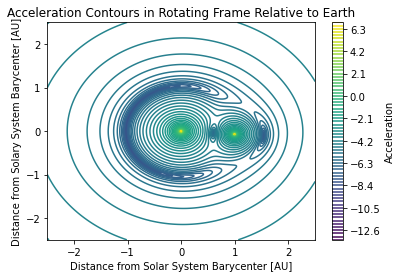

In [64]:
plt.figure("acceleration contours in rotating frame")
plt.title("Acceleration Contours in Rotating Frame Relative to Earth")
plt.contour(X/au,Y/au,np.log(acceleration.value), levels=70)
plt.xlabel("Distance from Solar System Barycenter [AU]")
plt.ylabel("Distance from Solary System Barycenter [AU]")
cbar = plt.colorbar()
cbar.ax.set_ylabel('Acceleration')
plt.show()

In [65]:
# now writing a function that will find the points of 0 acceleration (lagrange points)

def find_lagrange(X,Y,acceleration):
    # searches acceleration 2d array for smallest 5 values andd returns the corresponding coordinate

    acceleration = acceleration.value
    
    # creating an array to store the lowest values in the acceleration matrix
    # also storing their relative position
    small_acceleration = np.full(10,fill_value = 1e-2)
    small_acceleration_pos = np.zeros((10,2), dtype = 'int')
    Lpoints = []

    # now searching acceleration array for the lowest values
    for i in range(len(acceleration)):
        # search each row for the minimum and if that is smaller than the largest one in small_acceleration,
        # then replace
        max_acceleration = np.amax(small_acceleration)
        max_acceleration_pos = np.argmax(small_acceleration) # position in the array holding the small accel values



        

        if np.amin(acceleration[i]) < max_acceleration:
            
            # these are the coordinates corresponding to the minimum in the row being looked at
            Xcoord = (X[i][np.argmin(acceleration[i])])/au
            Ycoord = (Y[i][np.argmin(acceleration[i])])/au
            print("------new minimum------")
            print(Xcoord,Ycoord)

            # now loop through the coordinates for the small accelerations
            j=0
            while j < len(small_acceleration_pos):

                # this is the coordinates of the small accelerations in the array that have already been determined
                # to be minimums
                Xcompare = (X[small_acceleration_pos[j][0]][small_acceleration_pos[j][1]])/au
                Ycompare = (Y[small_acceleration_pos[j][0]][small_acceleration_pos[j][1]])/au
                print("-----compare to this-----")
                print(Xcompare,Ycompare)
                


                # this if condition checks if they are too close to the existing minimums found
                if abs(Xcoord-Xcompare) < 0.5 and abs(Ycoord-Ycompare) < 0.5:
                    print("this is the same L point")
                    # if they are too close, it is considered the same lagrange point and we do not append this
                    # to the list of small accelerations
                    # checking the next coordinate in the small pos array
                    break # then exit the while loop since we know we do not want to consider this coordinate

                else:

                    if j == (len(small_acceleration_pos) - 1):
                        small_acceleration[max_acceleration_pos] = acceleration[i][np.argmin(acceleration[i])]
                        small_acceleration_pos[max_acceleration_pos][0] = i
                        small_acceleration_pos[max_acceleration_pos][1] = np.argmin(acceleration[i])
                        Lpoints.append([Xcoord,Ycoord])
                        print("this is a different L point, appended")
                        break

                    else:
                        print("not the same L point, check rest of array")
                        j+=1 # continue searching through the smallaccelleration pos array
                        


    #print(small_acceleration)
    #print(small_acceleration_pos)
    print(Lpoints)
   
 



     
    
    return Lpoints

L_points = find_lagrange(X,Y,acceleration)

    
    

------new minimum------
0.037537537537537524 -1.9994994994994995
-----compare to this-----
-2.5 -2.5
not the same L point, check rest of array
-----compare to this-----
-2.5 -2.5
not the same L point, check rest of array
-----compare to this-----
-2.5 -2.5
not the same L point, check rest of array
-----compare to this-----
-2.5 -2.5
not the same L point, check rest of array
-----compare to this-----
-2.5 -2.5
not the same L point, check rest of array
-----compare to this-----
-2.5 -2.5
not the same L point, check rest of array
-----compare to this-----
-2.5 -2.5
not the same L point, check rest of array
-----compare to this-----
-2.5 -2.5
not the same L point, check rest of array
-----compare to this-----
-2.5 -2.5
not the same L point, check rest of array
-----compare to this-----
-2.5 -2.5
this is a different L point, appended
------new minimum------
0.037537537537537524 -1.9944944944944947
-----compare to this-----
0.037537537537537524 -1.9994994994994995
this is the same L point
--

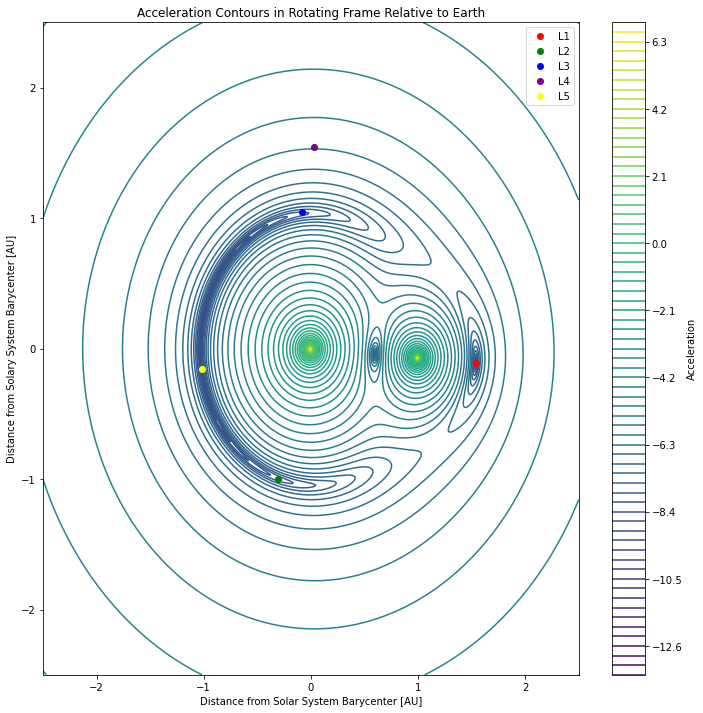

In [74]:
plt.figure("acceleration contours in rotating frame",figsize=(12,12))
plt.title("Acceleration Contours in Rotating Frame Relative to Earth")
plt.contour(X/au,Y/au,np.log(acceleration.value), levels=70)
plt.plot(L_points[5][0], L_points[5][1],"o", c ="red" , label = "L1")
plt.plot(L_points[2][0], L_points[2][1],"o", c ="green" , label = "L2")
plt.plot(L_points[8][0], L_points[8][1],"o", c ="blue" , label = "L3")
plt.plot(L_points[9][0], L_points[9][1],"o", c ="purple" , label = "L4")
plt.plot(L_points[4][0], L_points[4][1],"o", c ="yellow" , label = "L5")
plt.xlabel("Distance from Solar System Barycenter [AU]")
plt.ylabel("Distance from Solary System Barycenter [AU]")
plt.legend()
cbar = plt.colorbar()
cbar.ax.set_ylabel('Acceleration')
plt.show()

need to figure out a way to distinguish the lowest points so i can find multiple lagrange points

change function to take time series positions to find evolution of lagrange points
